# NX414 - MINI PROJECT - Notebook
Myriam HAMON and David MARTIN-OSORIO

In [1]:
# --- Imports ---

# -- Preliminary part --
import sys
from utils import load_it_data, visualize_img
import matplotlib.pyplot as plt
import numpy as np
import gdown

# -- Part 1 --
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.metrics import explained_variance_score
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.linear_model import RidgeCV
import matplotlib.ticker

# -- Part 2 --
import torchvision.models as models
import torch
import torchvision.transforms as transforms
from torchvision.models.feature_extraction import create_feature_extractor
from sklearn.decomposition import PCA, IncrementalPCA
import warnings
import sklearn.metrics
import sklearn.linear_model

# -- Part 3 --
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from torchvision import transforms
import torch.nn as nn
import torch.nn.functional as F
import sklearn.metrics
from tqdm import tqdm
import pandas as pd





In [ ]:
!{sys.executable} -m pip install gdown h5py

In [ ]:
url = "https://drive.google.com/file/d/1s6caFNRpyR9m7ZM6XEv_e8mcXT3_PnHS/view?usp=share_link"
output = "IT_data.h5"
gdown.download(url, output, quiet=False, fuzzy=True)

Downloading...
From (original): https://drive.google.com/uc?id=1s6caFNRpyR9m7ZM6XEv_e8mcXT3_PnHS
From (redirected): https://drive.google.com/uc?id=1s6caFNRpyR9m7ZM6XEv_e8mcXT3_PnHS&confirm=t&uuid=d081ad72-3950-463d-9c0c-719868d4b353
To: /content/IT_data.h5
100%|██████████| 384M/384M [00:14<00:00, 26.9MB/s]


'IT_data.h5'

# Loading the data :

In [2]:
path_to_data = '' ## Insert the folder where the data is, if you download in the same folder as this notebook then leave it blank
stimulus_train, stimulus_val, stimulus_test, objects_train, objects_val, objects_test, spikes_train, spikes_val = load_it_data(path_to_data)

In [5]:
n_stimulus, n_channels, img_size, _ = stimulus_train.shape
_, n_neurons = spikes_train.shape
print('The train dataset contains {} stimuli and {} IT neurons'.format(n_stimulus,n_neurons))
print('Each stimulus have {} channgels (RGB)'.format(n_channels))
print('The size of the image is {}x{}'.format(img_size,img_size))

The train dataset contains 2592 stimuli and 168 IT neurons
Each stimulus have 3 channgels (RGB)
The size of the image is 224x224


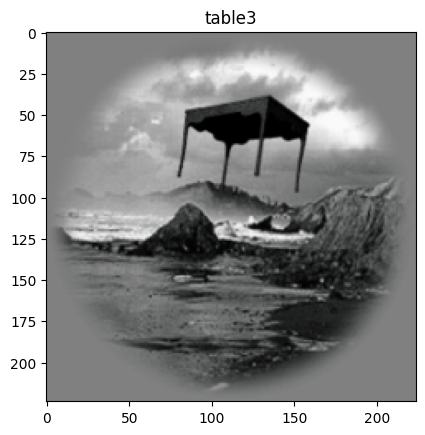

In [6]:
stim_idx = 1

visualize_img(stimulus_train,objects_train,stim_idx)

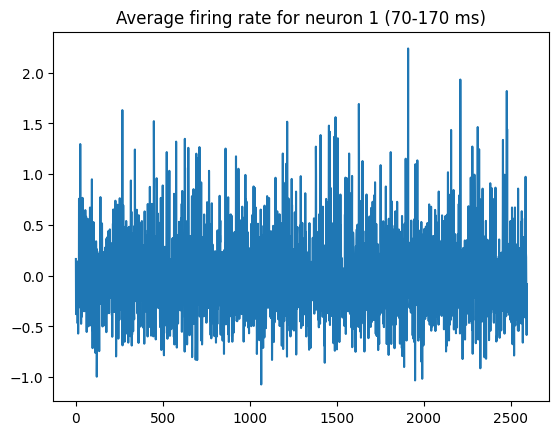

In [ ]:
neuron_idx = 1

plt.figure()
plt.title('Average firing rate for neuron {} (70-170 ms)'.format(neuron_idx))
plt.plot(spikes_train[:,neuron_idx])

# Part 4 - Developping the most accurate model for predicting IT neural activity.


## Exploring simple CNN architecture for data-driven model

In [74]:
class ITDataset(Dataset):
    def __init__(self, image_list, neural_data, transform=None):
        self.image_list = image_list
        self.neural_data = torch.tensor(neural_data, dtype=torch.float32)
        self.transform = transform if transform else transforms.ToTensor()

    def __len__(self):
        return len(self.image_list)

    def __getitem__(self, idx):
        img = self.image_list[idx]

        if isinstance(img, np.ndarray):
            if img.ndim != 3 or img.shape[0] != 3:
                raise ValueError(f"Unexpected image shape: {img.shape}")
            img = torch.from_numpy(img).float() 

        return img, self.neural_data[idx]

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])


# Create dataset and dataloader
dataset = ITDataset(stimulus_train, spikes_train)
train_loader = DataLoader(dataset, batch_size=32, shuffle=True)
dataset = ITDataset(np.concatenate((stimulus_train, stimulus_val), axis = 0), np.concatenate((spikes_train, spikes_val), axis = 0))


TODO

In [87]:

class ShallowCNN_6_conv_with_dropout(nn.Module):
    def __init__(self, output_size):
        super(ShallowCNN_6_conv_with_dropout, self).__init__()

        self.conv_layers = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=5, stride=2, padding=2),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d(2),

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d((2, 2)),

            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d((2, 2)),

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d((2, 2)),

            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d((4, 4)) ,

        )

        self.flattened_size = 128 * 4 * 4

        self.fc_layers = nn.Sequential(
            nn.Linear(self.flattened_size, 512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, output_size)
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = x.view(x.size(0), -1)  # flatten
        x = self.fc_layers(x)
        return x


model = ShallowCNN_6_conv_with_dropout(output_size=spikes_train.shape[1])
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

num_epochs = 200

100%|██████████| 100/100 [05:09<00:00,  3.10s/it]


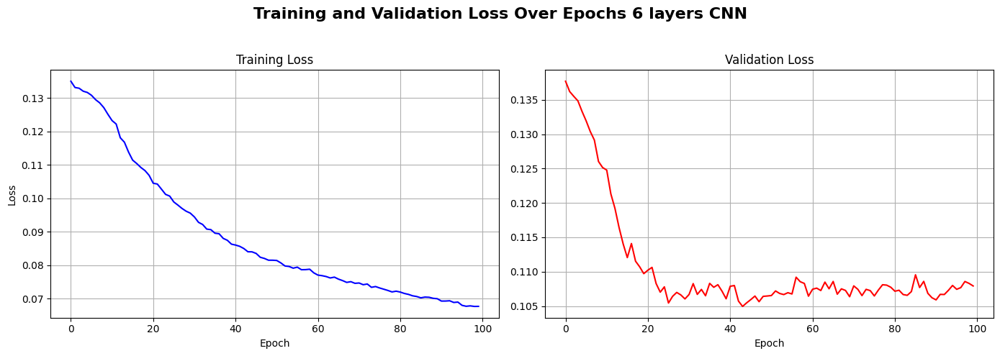

In [88]:
EPOCHS = 100

val_losses = []
train_losses = []

for epoch in tqdm(range(EPOCHS)):
    model.train()
    running_loss = 0.0
    for imgs, targets in loader_train:
        imgs, targets = imgs.to(device), targets.to(device)
        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    epoch_train_loss = running_loss / len(loader_train)
    train_losses.append(epoch_train_loss)

    # Validation mode
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for imgs, targets in loader_val:
            imgs, targets = imgs.to(device), targets.to(device)
            outputs = model(imgs)
            loss = criterion(outputs, targets)
            val_loss += loss.item()
    epoch_val_loss = val_loss / len(loader_val)
    val_losses.append(epoch_val_loss)

fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=False)

# training loss
axes[0].plot(train_losses, color='blue')
axes[0].set_title("Training Loss")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].grid(True)

# validation loss
axes[1].plot(val_losses, color='red')
axes[1].set_title("Validation Loss")
axes[1].set_xlabel("Epoch")
axes[1].grid(True)

fig.suptitle("Training and Validation Loss Over Epochs 6 layers CNN", fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [81]:
activations = {}
def get_activation(name):
    def hook(model, input, output):
        activations[name] = output.detach()
    return hook
model.conv_layers[0].register_forward_hook(get_activation('conv1'))
model.conv_layers[3].register_forward_hook(get_activation('conv2'))
model.conv_layers[6].register_forward_hook(get_activation('conv3'))
model.conv_layers[9].register_forward_hook(get_activation('conv4'))
model.conv_layers[12].register_forward_hook(get_activation('conv5'))
model.conv_layers[15].register_forward_hook(get_activation('conv6'))
model.fc_layers[0].register_forward_hook(get_activation('fc1'))
model.fc_layers[1].register_forward_hook(get_activation('fc2'))

imgs = torch.stack([img for img, _ in dataset])
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
imgs = imgs.to(device)
output = model(imgs)

layer_pc = {}
n_components = 100

for layer in activations.keys():
    feature = activations[layer].squeeze().cpu().detach().numpy()
    feature_flatten = feature.reshape(feature.shape[0], -1)
    pca = PCA(n_components=n_components)
    pcs = pca.fit_transform(feature_flatten)
    layer_pc[layer] = pcs


In [82]:
labels =  torch.stack([label for _, label in dataset])
labels = labels.to("cpu")
output = output.to("cpu").detach().numpy()
training_labels = labels[:stimulus_train.shape[0]]
testing_labels = labels[stimulus_train.shape[0]:]
training_output = output[:stimulus_train.shape[0]]
testing_output = output[stimulus_train.shape[0]:]

ev_training = explained_variance_score(training_labels, training_output, multioutput='raw_values')
ev_testing = explained_variance_score(testing_labels, testing_output, multioutput='raw_values')

corr_matrix_training = np.corrcoef(spikes_train,  training_output, rowvar=False)
corr_matrix_testing = np.corrcoef(spikes_val,  testing_output, rowvar=False)
mse = sklearn.metrics.mean_squared_error(spikes_train, training_output)
print('Training mse ' + str(mse))
mse = sklearn.metrics.mean_squared_error(spikes_val, testing_output)
print('Testing mse ' + str(mse))

Training mse 0.06225491687655449
Testing mse 0.10302092134952545


In [83]:
train_predictions = {}
val_predictions = {}
alphas = np.logspace(-12, 12, 26)

model = sklearn.linear_model.RidgeCV(alphas=alphas, store_cv_results=True)

print(' 6 layers CNN')

for layer in layer_pc.keys():
    print('Layer ' + layer)
    train_activations = layer_pc[layer][0:stimulus_train.shape[0]]
    test_activations = layer_pc[layer][stimulus_train.shape[0]:]
    model.fit(train_activations, spikes_train)

    score_train = model.score(train_activations, spikes_train)
    score = model.score(test_activations, spikes_val)
    pred = model.predict(test_activations)
    mse = sklearn.metrics.mean_squared_error(spikes_val, pred)
    pred_train = model.predict(train_activations)
    train_predictions[layer] = pred_train
    val_predictions[layer] = pred

    print(f"Train R2: {round(score_train, 5)}; Test R2: {round(score, 5)}; "
        f"Test MSE: {round(mse, 5)}; Best alpha: {model.alpha_}")

 6 layers CNN
Layer conv1
Train R2: 0.13121; Test R2: 0.08885; Test MSE: 0.12628; Best alpha: 190546.0717963252
Layer conv2
Train R2: 0.20462; Test R2: 0.1687; Test MSE: 0.11294; Best alpha: 190546.0717963252
Layer conv3
Train R2: 0.28182; Test R2: 0.22843; Test MSE: 0.10351; Best alpha: 0.3311311214825908
Layer conv4
Train R2: 0.34762; Test R2: 0.21291; Test MSE: 0.10571; Best alpha: 0.3311311214825908
Layer conv5
Train R2: 0.40964; Test R2: 0.21693; Test MSE: 0.10549; Best alpha: 0.3311311214825908
Layer conv6
Train R2: 0.44093; Test R2: 0.22891; Test MSE: 0.10405; Best alpha: 0.3311311214825908
Layer fc1
Train R2: 0.45436; Test R2: 0.21523; Test MSE: 0.10607; Best alpha: 3.019951720402019
Layer fc2
Train R2: 0.49284; Test R2: 0.22641; Test MSE: 0.10437; Best alpha: 3.019951720402019


Layer conv1 mean validation explained variance 0.09277969927841245
Layer conv2 mean validation explained variance 0.1726434781481398
Layer conv3 mean validation explained variance 0.232426095775071
Layer conv4 mean validation explained variance 0.2157369302876899
Layer conv5 mean validation explained variance 0.2199353768942219
Layer conv6 mean validation explained variance 0.23203062009463757
Layer fc1 mean validation explained variance 0.21842399441946614
Layer fc2 mean validation explained variance 0.22962843218849244


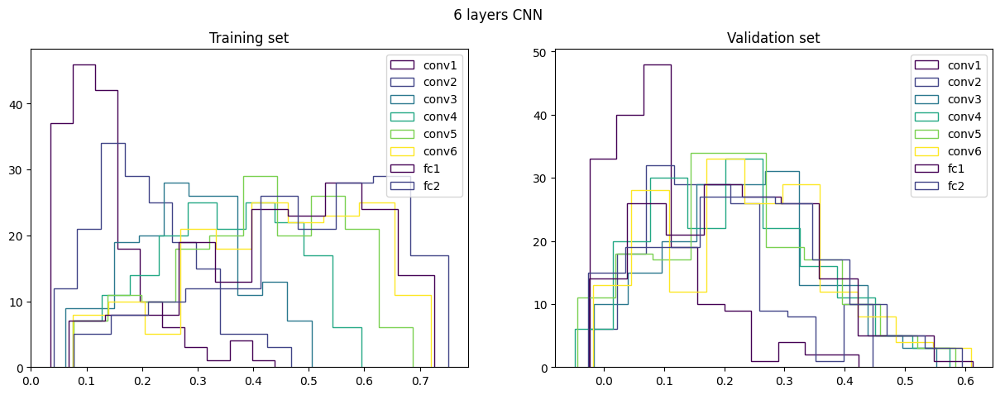

In [84]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
plt.suptitle(' 6 layers CNN')
for layer in layer_pc.keys():
    explained_variance_train = explained_variance_score(spikes_train, train_predictions[layer], multioutput='raw_values')
    explained_variance_val = explained_variance_score(spikes_val, val_predictions[layer], multioutput='raw_values')
    print('Layer ' + layer + ' mean validation explained variance ' + str(np.mean(explained_variance_val)))

    axes[0].hist(explained_variance_train, label = layer, histtype = 'step')
    axes[0].set_title("Training set")
    axes[1].hist(explained_variance_val, label = layer, histtype = 'step')
    axes[1].set_title("Validation set")
axes[0].legend()
axes[1].legend()
plt.show()

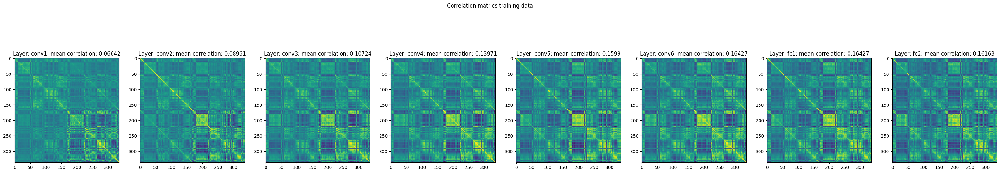

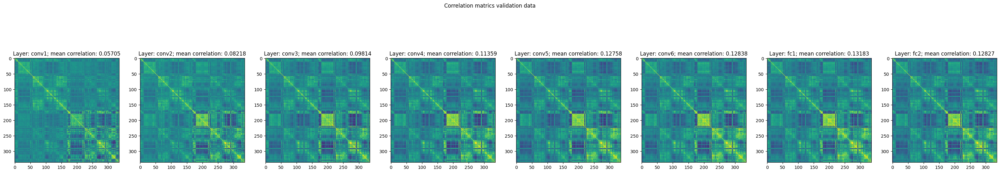

In [85]:
fig, axes = plt.subplots(1, 8, figsize=(40, 7))
plt.suptitle(' 6 layers CNN')

i = 0

for layer in layer_pc.keys():
    corr_matrix = np.corrcoef(spikes_train,  train_predictions[layer], rowvar=False)
    axes[i].imshow(corr_matrix)
    axes[i].set_title(f"Layer: {layer}; mean correlation: {round(np.mean(corr_matrix), 5)}")
    i += 1
plt.suptitle("Correlation matrics training data")
plt.show()

fig, axes = plt.subplots(1, 8, figsize=(40, 7))
i = 0

for layer in layer_pc.keys():
    corr_matrix_val = np.corrcoef(spikes_val,  val_predictions[layer], rowvar=False)
    axes[i].imshow(corr_matrix_val)
    axes[i].set_title(f"Layer: {layer}; mean correlation: {round(np.mean(corr_matrix_val), 5)}")
    i += 1
plt.suptitle("Correlation matrics validation data")
plt.show()

Going from 4 layers to 6 layers does not seem to help with the regression, with very similar performance in the regression score, the explained variance and the correlation matrixes

## Trying more complex established architectures

In [89]:
resnet_not_pretrained = models.resnet50()
output_size=spikes_train.shape[1]
num_features = resnet_not_pretrained.fc.in_features
resnet_not_pretrained.fc = nn.Linear(num_features,output_size)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resnet_not_pretrained = resnet_not_pretrained.to(device)

criterion = nn.MSELoss()
optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, resnet_not_pretrained.parameters()), lr=1e-4)


100%|██████████| 100/100 [27:51<00:00, 16.72s/it]


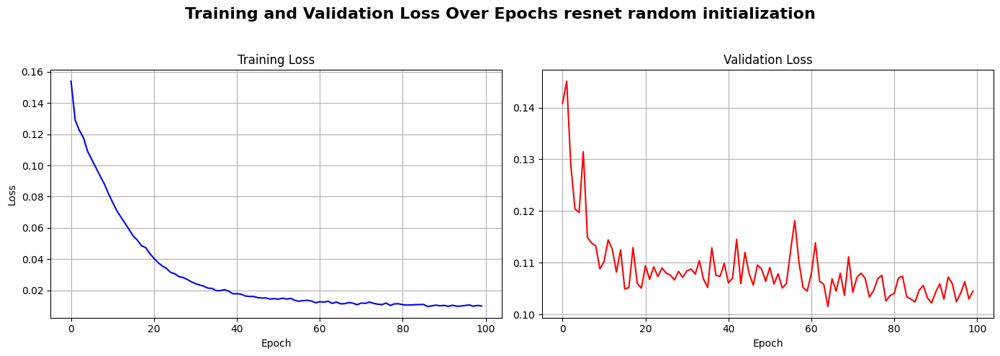

In [90]:

EPOCHS = 100

val_losses = []
train_losses = []

for epoch in tqdm(range(EPOCHS)):
    resnet_not_pretrained.train()
    running_loss = 0.0
    for imgs, targets in loader_train:
        imgs, targets = imgs.to(device), targets.to(device)
        optimizer.zero_grad()
        outputs = resnet_not_pretrained(imgs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    epoch_train_loss = running_loss / len(loader_train)
    train_losses.append(epoch_train_loss)

    # Validation mode
    resnet_not_pretrained.eval()
    val_loss = 0.0
    with torch.no_grad():
        for imgs, targets in loader_val:
            imgs, targets = imgs.to(device), targets.to(device)
            outputs = resnet_not_pretrained(imgs)
            loss = criterion(outputs, targets)
            val_loss += loss.item()
    epoch_val_loss = val_loss / len(loader_val)
    val_losses.append(epoch_val_loss)

fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=False)

# training loss
axes[0].plot(train_losses, color='blue')
axes[0].set_title("Training Loss")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].grid(True)

# validation loss
axes[1].plot(val_losses, color='red')
axes[1].set_title("Validation Loss")
axes[1].set_xlabel("Epoch")
axes[1].grid(True)

fig.suptitle("Training and Validation Loss Over Epochs resnet random initialization", fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [91]:
return_nodes = {
    'conv1': 'conv1',
    'layer1': 'layer1',
    'layer2': 'layer2',
    'layer3': 'layer3',
    'layer4': 'layer4',
    'avgpool': 'avgpool'
}

model_not_pretrained = create_feature_extractor(resnet_not_pretrained, return_nodes=return_nodes)
n_components = 1000

layer_pc_not_trained = {}


for layer in return_nodes.values():
    print(f"Extracting layer: {layer}")
    acts = []
    for img in stimulus_tensors.to(device):
        out = model_not_pretrained(img.unsqueeze(0))
        feature = out[layer].squeeze().cpu().detach().numpy()
        acts.append(feature.flatten())
    acts = np.stack(acts)
    pca = PCA(n_components=n_components)

    pcs = pca.fit_transform(acts)
    layer_pc_not_trained[layer] = pcs



Extracting layer: conv1
Extracting layer: layer1
Extracting layer: layer2
Extracting layer: layer3
Extracting layer: layer4
Extracting layer: avgpool


In [92]:
train_predictions = {}
val_predictions = {}
alphas = np.logspace(-12, 12, 26)

model = sklearn.linear_model.RidgeCV(alphas=alphas, store_cv_results=True)

print('Resnet random initialization')

for layer in layer_pc_not_trained.keys():
    print('Layer ' + layer)
    train_activations = layer_pc_not_trained[layer][0:stimulus_train.shape[0]]
    test_activations = layer_pc_not_trained[layer][stimulus_train.shape[0]:]
    model.fit(train_activations, spikes_train)

    score_train = model.score(train_activations, spikes_train)
    score = model.score(test_activations, spikes_val)
    pred = model.predict(test_activations)
    mse = sklearn.metrics.mean_squared_error(spikes_val, pred)
    pred_train = model.predict(train_activations)
    train_predictions[layer] = pred_train
    val_predictions[layer] = pred

    print(f"Train R2: {round(score_train, 5)}; Test R2: {round(score, 5)}; "
        f"Test MSE: {round(mse, 5)}; Best alpha: {model.alpha_}")

Resnet random initialization
Layer conv1
Train R2: 0.20239; Test R2: 0.08648; Test MSE: 0.12628; Best alpha: 190546.0717963252
Layer layer1
Train R2: 0.44325; Test R2: 0.23618; Test MSE: 0.10217; Best alpha: 1737800.8287493691
Layer layer2
Train R2: 0.41388; Test R2: 0.24225; Test MSE: 0.10158; Best alpha: 1737800.8287493691
Layer layer3
Train R2: 0.62923; Test R2: 0.24864; Test MSE: 0.09895; Best alpha: 190546.0717963252
Layer layer4
Train R2: 0.9255; Test R2: 0.26107; Test MSE: 0.09434; Best alpha: 20892.96130854041
Layer avgpool
Train R2: 0.97605; Test R2: 0.25183; Test MSE: 0.09555; Best alpha: 27.542287033381633


Layer conv1 mean validation explained variance 0.09050127176556441
Layer layer1 mean validation explained variance 0.23993752206721367
Layer layer2 mean validation explained variance 0.24648973840187405
Layer layer3 mean validation explained variance 0.2522228181086451
Layer layer4 mean validation explained variance 0.26730442593974585
Layer avgpool mean validation explained variance 0.2577229391972632


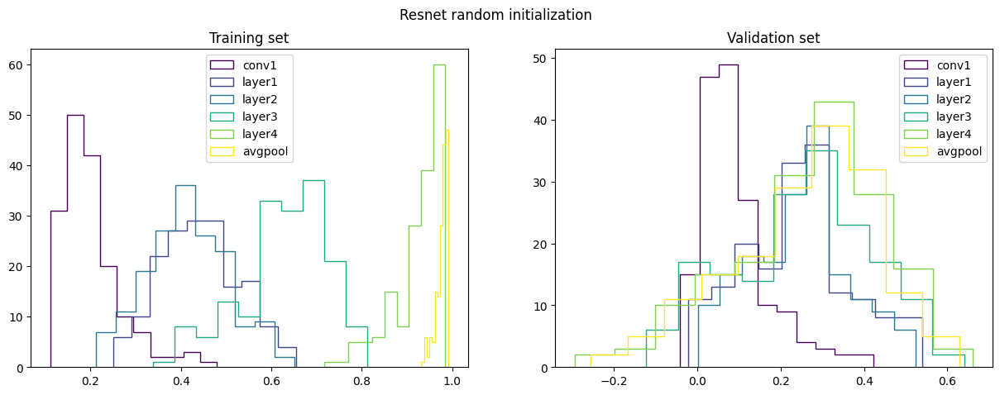

In [94]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
plt.suptitle('Resnet random initialization')
for layer in layer_pc_not_trained.keys():

    explained_variance_train = explained_variance_score(spikes_train, train_predictions[layer], multioutput='raw_values')
    explained_variance_val = explained_variance_score(spikes_val, val_predictions[layer], multioutput='raw_values')
    print('Layer ' + layer + ' mean validation explained variance ' + str(np.mean(explained_variance_val)))

    axes[0].hist(explained_variance_train, label = layer, histtype = 'step')
    axes[0].set_title("Training set")
    axes[1].hist(explained_variance_val, label = layer, histtype = 'step')
    axes[1].set_title("Validation set")
axes[0].legend()
axes[1].legend()
plt.show()

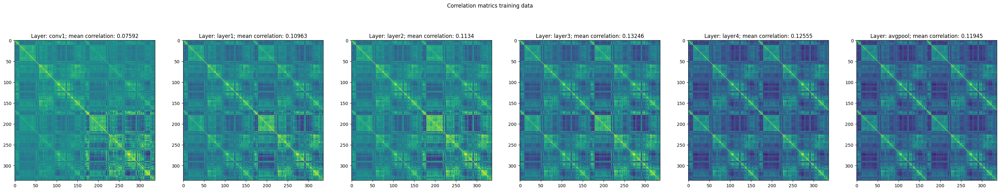

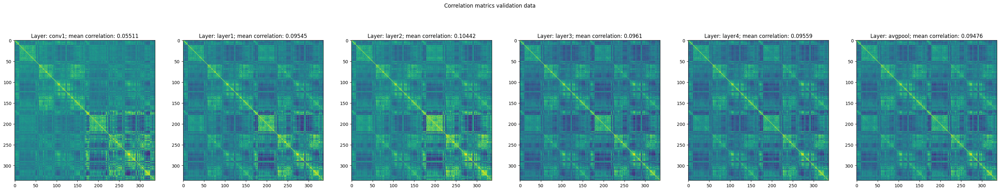

In [95]:
fig, axes = plt.subplots(1, 6, figsize=(40, 7))
plt.suptitle('Resnet random initialization')

i = 0

for layer in layer_pc_not_trained.keys():
    corr_matrix = np.corrcoef(spikes_train,  train_predictions[layer], rowvar=False)
    axes[i].imshow(corr_matrix)
    axes[i].set_title(f"Layer: {layer}; mean correlation: {round(np.mean(corr_matrix), 5)}")
    i += 1
plt.suptitle("Correlation matrics training data")
plt.show()

fig, axes = plt.subplots(1, 6, figsize=(40, 7))
i = 0

for layer in layer_pc_not_trained.keys():
    corr_matrix_val = np.corrcoef(spikes_val,  val_predictions[layer], rowvar=False)
    axes[i].imshow(corr_matrix_val)
    axes[i].set_title(f"Layer: {layer}; mean correlation: {round(np.mean(corr_matrix_val), 5)}")
    i += 1
plt.suptitle("Correlation matrics validation data")
plt.show()

This more complex architecture works a lot better than the shallow cnns, both on the regression score, the explained variance and the correlation matrices. A middle layer seem to be the most informative, in a similar way to the goal-driven network, but here the data-driven resnet has less differences between layers.

## Resnet pretrained, with last layers retrained to predict spikes => transfer learning

link to this network trained : https://drive.google.com/file/d/1OIOwfslgsR0LRVzZ0BCx4YLSh5NziJJS/view?usp=sharing
download than load under the name resnet

In [99]:


resnet = models.resnet50(weights='ResNet50_Weights.IMAGENET1K_V1')

for param in resnet.parameters():
    param.requires_grad = False
for param in resnet.layer4.parameters():
    param.requires_grad = True
for param in resnet.avgpool.parameters():
    param.requires_grad = True

num_features = resnet.fc.in_features
resnet.fc = nn.Linear(num_features,output_size)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resnet = resnet.to(device)

criterion = nn.MSELoss()
optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, resnet.parameters()), lr=1e-4)



100%|██████████| 100/100 [1:22:43<00:00, 49.64s/it]


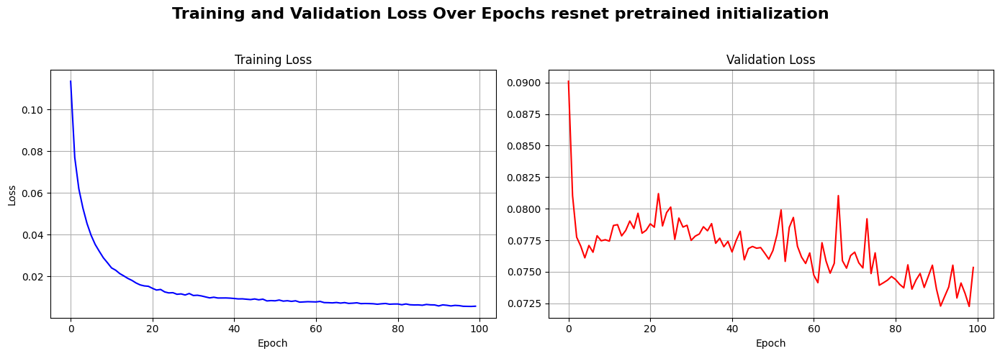

In [100]:

EPOCHS = 100

val_losses = []
train_losses = []

for epoch in tqdm(range(EPOCHS)):
    resnet.train()
    running_loss = 0.0
    for imgs, targets in loader_train:
        imgs, targets = imgs.to(device), targets.to(device)
        optimizer.zero_grad()
        outputs = resnet(imgs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    epoch_train_loss = running_loss / len(loader_train)
    train_losses.append(epoch_train_loss)

    # Validation mode
    resnet.eval()
    val_loss = 0.0
    with torch.no_grad():
        for imgs, targets in loader_val:
            imgs, targets = imgs.to(device), targets.to(device)
            outputs = resnet(imgs)
            loss = criterion(outputs, targets)
            val_loss += loss.item()
    epoch_val_loss = val_loss / len(loader_val)
    val_losses.append(epoch_val_loss)

fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=False)

# training loss
axes[0].plot(train_losses, color='blue')
axes[0].set_title("Training Loss")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].grid(True)

# validation loss
axes[1].plot(val_losses, color='red')
axes[1].set_title("Validation Loss")
axes[1].set_xlabel("Epoch")
axes[1].grid(True)

fig.suptitle("Training and Validation Loss Over Epochs resnet pretrained initialization", fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [101]:
return_nodes = {
    'conv1': 'conv1',
    'layer4': 'layer4',
    'avgpool': 'avgpool'
}

stimulus_tensors = torch.tensor(np.concatenate((stimulus_train, stimulus_val)))

model_pretrained = create_feature_extractor(resnet, return_nodes=return_nodes)
layer_pc = {}
n_components = 1000

for layer in return_nodes.values():
    print(f"Extracting layer: {layer}")
    acts = []
    for img in stimulus_tensors.to(device):
        out = model_pretrained(img.unsqueeze(0))
        feature = out[layer].squeeze().cpu().detach().numpy()
        acts.append(feature.flatten())
    acts = np.stack(acts)
    pca = PCA(n_components=n_components)

    pcs = pca.fit_transform(acts)
    layer_pc[layer] = pcs



Extracting layer: conv1
Extracting layer: layer4
Extracting layer: avgpool


In [102]:
train_predictions = {}
val_predictions = {}
alphas = np.logspace(-12, 12, 26)

model = sklearn.linear_model.RidgeCV(alphas=alphas, store_cv_results=True)

print('Transfer learning with Resnet')

for layer in layer_pc.keys():
    print('Layer ' + layer)
    train_activations = layer_pc[layer][0:stimulus_train.shape[0]]
    test_activations = layer_pc[layer][stimulus_train.shape[0]:]
    model.fit(train_activations, spikes_train)

    score_train = model.score(train_activations, spikes_train)
    score = model.score(test_activations, spikes_val)
    pred = model.predict(test_activations)
    mse = sklearn.metrics.mean_squared_error(spikes_val, pred)
    pred_train = model.predict(train_activations)
    train_predictions[layer] = pred_train
    val_predictions[layer] = pred

    print(f"Train R2: {round(score_train, 5)}; Test R2: {round(score, 5)}; "
        f"Test MSE: {round(mse, 5)}; Best alpha: {model.alpha_}")

Transfer learning with Resnet
Layer conv1
Train R2: 0.27748; Test R2: 0.09168; Test MSE: 0.1255; Best alpha: 1737800.8287493691
Layer layer4
Train R2: 0.97901; Test R2: 0.39574; Test MSE: 0.07021; Best alpha: 2290.86765276777
Layer avgpool
Train R2: 0.99302; Test R2: 0.39845; Test MSE: 0.07026; Best alpha: 3.019951720402019


Layer conv1 mean explained variance 0.09557256770263718
Layer layer4 mean explained variance 0.3998801645291963
Layer avgpool mean explained variance 0.402455875116353


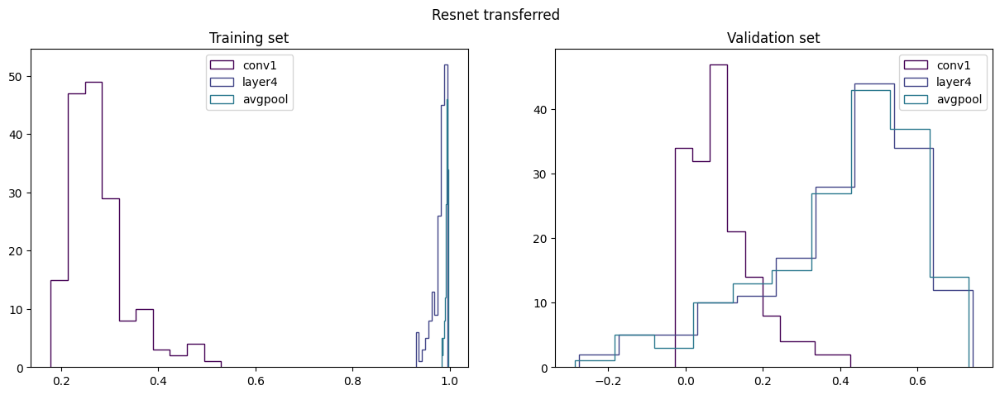

In [104]:
from sklearn.metrics import explained_variance_score

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
plt.suptitle('Resnet transferred')
for layer in layer_pc.keys():
    explained_variance_train = explained_variance_score(spikes_train, train_predictions[layer], multioutput='raw_values')
    explained_variance_val = explained_variance_score(spikes_val, val_predictions[layer], multioutput='raw_values')
    print('Layer ' + layer + ' mean explained variance ' + str(np.mean(explained_variance_val)))
    axes[0].hist(explained_variance_train, label = layer, histtype = 'step')
    axes[0].set_title("Training set")
    axes[1].hist(explained_variance_val, label = layer, histtype = 'step')
    axes[1].set_title("Validation set")
axes[0].legend()
axes[1].legend()
plt.show()

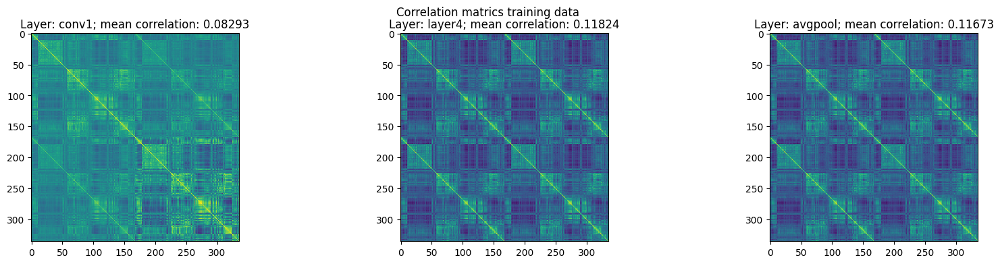

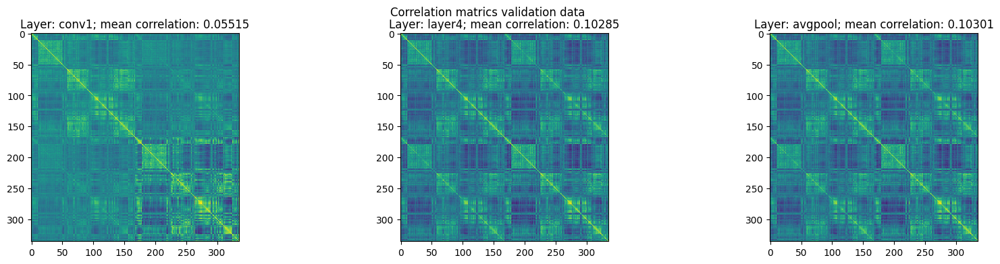

In [106]:
fig, axes = plt.subplots(1, 3, figsize=(20, 4))
plt.suptitle('Resnet transferred')

i = 0

for layer in layer_pc.keys():
    corr_matrix = np.corrcoef(spikes_train,  train_predictions[layer], rowvar=False)
    axes[i].imshow(corr_matrix)
    axes[i].set_title(f"Layer: {layer}; mean correlation: {round(np.mean(corr_matrix), 5)}")
    i += 1
plt.suptitle("Correlation matrics training data")
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(20, 4))
i = 0

for layer in layer_pc.keys():
    corr_matrix_val = np.corrcoef(spikes_val,  val_predictions[layer], rowvar=False)
    axes[i].imshow(corr_matrix_val)
    axes[i].set_title(f"Layer: {layer}; mean correlation: {round(np.mean(corr_matrix_val), 5)}")
    i += 1
plt.suptitle("Correlation matrics validation data")
plt.show()

For the partially retrained resnet, the performance of the regression is even better, especially for the retrained layers to predict spikes. This increase in performance in comparison to the completely trained resnet from our data can be explained by the fact that this pretrained network was exposed to a much larger dataset of images and therefore the middle layers are supposedly better at extracting features, and just retraining a few layers to predict spikes also allows the network to be better at predicting spikes and therefore the regression on the activation of the layers is also better.

In [116]:
alexnet = torch.hub.load('pytorch/vision:v0.10.0', 'alexnet', pretrained=True)


Using cache found in C:\Users\mhamon/.cache\torch\hub\pytorch_vision_v0.10.0


In [117]:
import torch.nn as nn
for param in alexnet.parameters():
    param.requires_grad = False
for param in alexnet.features[10].parameters():
    param.requires_grad = True
for param in alexnet.features[11].parameters():
    param.requires_grad = True
for param in alexnet.features[12].parameters():
    param.requires_grad = True
for param in alexnet.avgpool.parameters():
    param.requires_grad = True
for param in alexnet.classifier.parameters():
    param.requires_grad = True
output_size=spikes_train.shape[1]

alexnet.classifier[6] = torch.nn.Linear(4096, output_size)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
alexnet = alexnet.to(device)

criterion = nn.MSELoss()
optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, alexnet.parameters()), lr=1e-4)


100%|██████████| 25/25 [01:25<00:00,  3.42s/it]


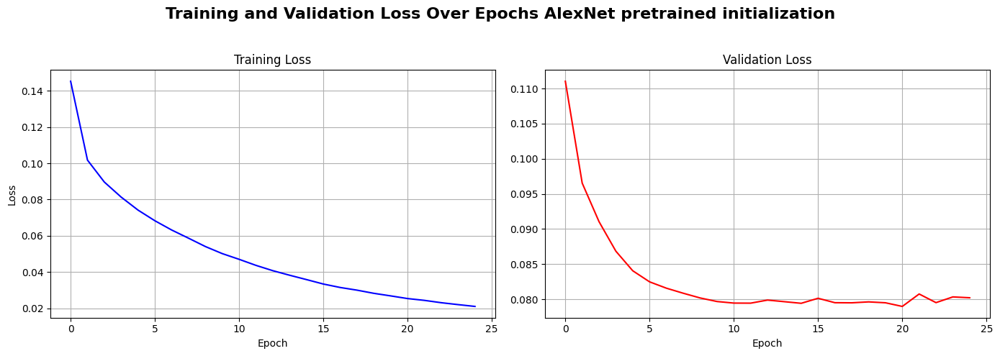

In [118]:

EPOCHS = 25

val_losses = []
train_losses = []

for epoch in tqdm(range(EPOCHS)):
    alexnet.train()
    running_loss = 0.0
    for imgs, targets in loader_train:
        imgs, targets = imgs.to(device), targets.to(device)
        optimizer.zero_grad()
        outputs = alexnet(imgs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    epoch_train_loss = running_loss / len(loader_train)
    train_losses.append(epoch_train_loss)

    # Validation mode
    alexnet.eval()
    val_loss = 0.0
    with torch.no_grad():
        for imgs, targets in loader_val:
            imgs, targets = imgs.to(device), targets.to(device)
            outputs = alexnet(imgs)
            loss = criterion(outputs, targets)
            val_loss += loss.item()
    epoch_val_loss = val_loss / len(loader_val)
    val_losses.append(epoch_val_loss)

fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=False)

# training loss
axes[0].plot(train_losses, color='blue')
axes[0].set_title("Training Loss")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].grid(True)

# validation loss
axes[1].plot(val_losses, color='red')
axes[1].set_title("Validation Loss")
axes[1].set_xlabel("Epoch")
axes[1].grid(True)

fig.suptitle("Training and Validation Loss Over Epochs AlexNet pretrained initialization", fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [119]:
dataset = ITDataset(np.concatenate((stimulus_train, stimulus_val), axis = 0), np.concatenate((spikes_train, spikes_val), axis = 0))
imgs = torch.stack([img for img, _ in dataset])
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
alexnet = alexnet.to(device)
imgs = imgs.to(device)
output = alexnet(imgs)

labels =  torch.stack([label for _, label in dataset])
labels = labels.to("cpu")
output = output.to("cpu").detach().numpy()
training_labels = labels[:stimulus_train.shape[0]]
testing_labels = labels[stimulus_train.shape[0]:]
training_output = output[:stimulus_train.shape[0]]
testing_output = output[stimulus_train.shape[0]:]

In [120]:
import sklearn
mse = sklearn.metrics.mean_squared_error(spikes_train, training_output)
print('Training mse of the transfer learning training ' + str(mse))
mse = sklearn.metrics.mean_squared_error(spikes_val, testing_output)
print('Testing mse' + str(mse))



Training mse of the transfer learning training 0.010882290080189705
Testing mse0.08020970970392227


In [121]:
return_nodes = {
    'features': 'features',
    'avgpool': 'avgpool',
}

stimulus_tensors = torch.tensor(np.concatenate((stimulus_train, stimulus_val)))

model_pretrained = create_feature_extractor(alexnet, return_nodes=return_nodes)
layer_pc = {}
n_components = 1000

for layer in return_nodes.values():
    print(f"Extracting layer: {layer}")
    acts = []
    for img in stimulus_tensors.to(device):
        out = model_pretrained(img.unsqueeze(0))
        feature = out[layer].squeeze().cpu().detach().numpy()
        acts.append(feature.flatten())
    acts = np.stack(acts)
    pca = PCA(n_components=n_components)

    pcs = pca.fit_transform(acts)
    layer_pc[layer] = pcs



Extracting layer: features
Extracting layer: avgpool


In [122]:
train_predictions = {}
val_predictions = {}
alphas = np.logspace(-12, 12, 26)

model = sklearn.linear_model.RidgeCV(alphas=alphas, store_cv_results=True)
print('AlexNet transferred')

for layer in layer_pc.keys():
    print('Layer ' + layer)
    train_activations = layer_pc[layer][0:stimulus_train.shape[0]]
    test_activations = layer_pc[layer][stimulus_train.shape[0]:]
    model.fit(train_activations, spikes_train)

    score_train = model.score(train_activations, spikes_train)
    score = model.score(test_activations, spikes_val)
    pred = model.predict(test_activations)
    mse = sklearn.metrics.mean_squared_error(spikes_val, pred)
    pred_train = model.predict(train_activations)
    train_predictions[layer] = pred_train
    val_predictions[layer] = pred

    print(f"Train R2: {round(score_train, 5)}; Test R2: {round(score, 5)}; "
        f"Test MSE: {round(mse, 5)}; Best alpha: {model.alpha_}")

AlexNet transferred
Layer features
Train R2: 0.53245; Test R2: 0.39013; Test MSE: 0.07741; Best alpha: 20892.96130854041
Layer avgpool
Train R2: 0.53246; Test R2: 0.38977; Test MSE: 0.07743; Best alpha: 20892.96130854041


Layer features mean explained variance 0.392625981939424
Layer avgpool mean explained variance 0.392989431747271


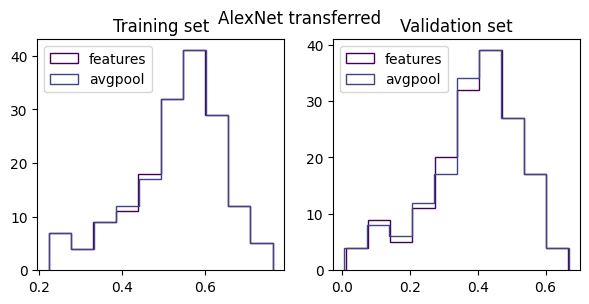

In [124]:
from sklearn.metrics import explained_variance_score

fig, axes = plt.subplots(1, 2, figsize=(7, 3))
plt.suptitle('AlexNet transferred')
for layer in layer_pc.keys():
    print('Layer ' + layer + ' mean explained variance ' + str(np.mean(explained_variance_val)))
    explained_variance_train = explained_variance_score(spikes_train, train_predictions[layer], multioutput='raw_values')
    explained_variance_val = explained_variance_score(spikes_val, val_predictions[layer], multioutput='raw_values')
    axes[0].hist(explained_variance_train, label = layer, histtype = 'step')
    axes[0].set_title("Training set")
    axes[1].hist(explained_variance_val, label = layer, histtype = 'step')
    axes[1].set_title("Validation set")
axes[0].legend()
axes[1].legend()
plt.show()

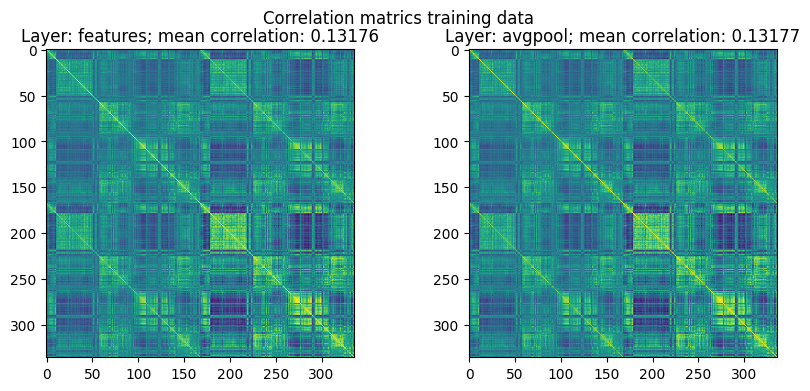

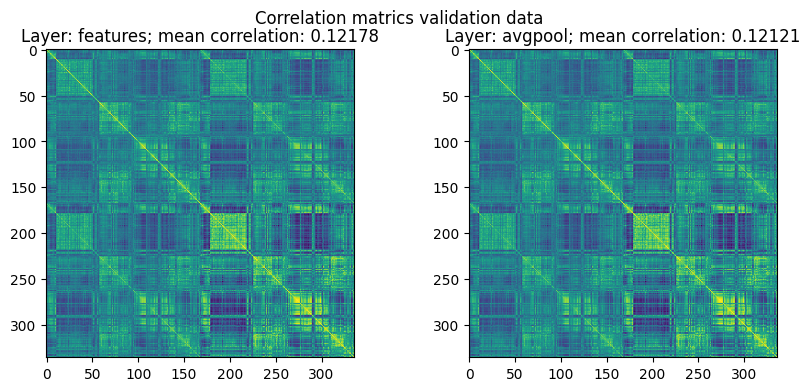

In [125]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
plt.suptitle('AlexNet transferred')

i = 0

for layer in layer_pc.keys():
    corr_matrix = np.corrcoef(spikes_train,  train_predictions[layer], rowvar=False)
    axes[i].imshow(corr_matrix)
    axes[i].set_title(f"Layer: {layer}; mean correlation: {round(np.mean(corr_matrix), 5)}")
    i += 1
plt.suptitle("Correlation matrics training data")
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
i = 0

for layer in layer_pc.keys():
    corr_matrix_val = np.corrcoef(spikes_val,  val_predictions[layer], rowvar=False)
    axes[i].imshow(corr_matrix_val)
    axes[i].set_title(f"Layer: {layer}; mean correlation: {round(np.mean(corr_matrix_val), 5)}")
    i += 1
plt.suptitle("Correlation matrics validation data")
plt.show()

The performance on the partially retrained AlexNet is very similar to the one from the partially retrained resnet, potentially slightly worse.

In [131]:
vgg = models.vgg19_bn(weights='DEFAULT')

In [ ]:
for param in vgg.parameters():
    param.requires_grad = False
for param in vgg.features[49].parameters():
    param.requires_grad = True
for param in vgg.features[50].parameters():
    param.requires_grad = True
for param in vgg.features[51].parameters():
    param.requires_grad = True
for param in vgg.features[52].parameters():
    param.requires_grad = True
for param in vgg.avgpool.parameters():
    param.requires_grad = True
for param in vgg.classifier.parameters():
    param.requires_grad = True
output_size=spikes_train.shape[1]

vgg.classifier[6] = torch.nn.Linear(4096, output_size)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vgg = vgg.to(device)

criterion = nn.MSELoss()
optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, vgg.parameters()), lr=1e-4)


100%|██████████| 25/25 [14:34<00:00, 35.00s/it]


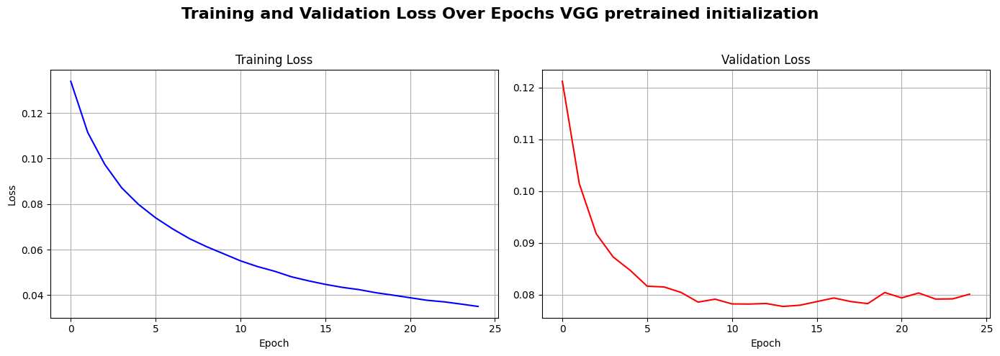

In [133]:

EPOCHS = 25

val_losses = []
train_losses = []

for epoch in tqdm(range(EPOCHS)):
    vgg.train()
    running_loss = 0.0
    for imgs, targets in loader_train:
        imgs, targets = imgs.to(device), targets.to(device)
        optimizer.zero_grad()
        outputs = vgg(imgs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    epoch_train_loss = running_loss / len(loader_train)
    train_losses.append(epoch_train_loss)

    # Validation mode
    vgg.eval()
    val_loss = 0.0
    with torch.no_grad():
        for imgs, targets in loader_val:
            imgs, targets = imgs.to(device), targets.to(device)
            outputs = vgg(imgs)
            loss = criterion(outputs, targets)
            val_loss += loss.item()
    epoch_val_loss = val_loss / len(loader_val)
    val_losses.append(epoch_val_loss)

fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=False)

# training loss
axes[0].plot(train_losses, color='blue')
axes[0].set_title("Training Loss")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].grid(True)

# validation loss
axes[1].plot(val_losses, color='red')
axes[1].set_title("Validation Loss")
axes[1].set_xlabel("Epoch")
axes[1].grid(True)

fig.suptitle("Training and Validation Loss Over Epochs VGG pretrained initialization", fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [134]:
return_nodes = {
    'features': 'features',
    'avgpool': 'avgpool',
}

stimulus_tensors = torch.tensor(np.concatenate((stimulus_train, stimulus_val)))

model_pretrained = create_feature_extractor(vgg, return_nodes=return_nodes)
layer_pc = {}
n_components = 1000
for layer in return_nodes.values():
    print(f"Extracting layer: {layer}")
    acts = []
    for img in stimulus_tensors.to(device):
        out = model_pretrained(img.unsqueeze(0))
        feature = out[layer].squeeze().cpu().detach().numpy()
        acts.append(feature.flatten())
    acts = np.stack(acts)
    pca = PCA(n_components=n_components)

    pcs = pca.fit_transform(acts)
    layer_pc[layer] = pcs

Extracting layer: features
Extracting layer: avgpool


In [136]:
train_predictions = {}
val_predictions = {}
alphas = np.logspace(-12, 12, 26)

model = sklearn.linear_model.RidgeCV(alphas=alphas, store_cv_results=True)

print('Vgg transferred')
for layer in layer_pc.keys():
    print('Layer ' + layer)
    train_activations = layer_pc[layer][0:stimulus_train.shape[0]]
    test_activations = layer_pc[layer][stimulus_train.shape[0]:]
    model.fit(train_activations, spikes_train)

    score_train = model.score(train_activations, spikes_train)
    score = model.score(test_activations, spikes_val)
    pred = model.predict(test_activations)
    mse = sklearn.metrics.mean_squared_error(spikes_val, pred)
    pred_train = model.predict(train_activations)
    train_predictions[layer] = pred_train
    val_predictions[layer] = pred

    print(f"Train R2: {round(score_train, 5)}; Test R2: {round(score, 5)}; "
        f"Test MSE: {round(mse, 5)}; Best alpha: {model.alpha_}")

Vgg transferred
Layer features
Train R2: 0.63355; Test R2: 0.39712; Test MSE: 0.07528; Best alpha: 2290.86765276777
Layer avgpool
Train R2: 0.63358; Test R2: 0.39721; Test MSE: 0.07519; Best alpha: 2290.86765276777


Layer features mean explained variance score 0.40014328430240403
Layer avgpool mean explained variance score 0.4003049677813273


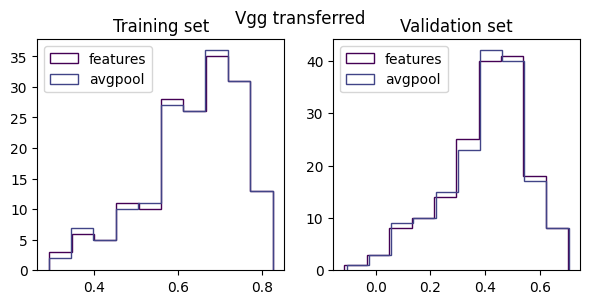

In [139]:
from sklearn.metrics import explained_variance_score

fig, axes = plt.subplots(1, 2, figsize=(7, 3))
plt.suptitle('Vgg transferred')

for layer in layer_pc.keys():
    explained_variance_train = explained_variance_score(spikes_train, train_predictions[layer], multioutput='raw_values')
    explained_variance_val = explained_variance_score(spikes_val, val_predictions[layer], multioutput='raw_values')
    print('Layer ' + str(layer) + ' mean explained variance score ' + str(np.mean(explained_variance_val)))

    axes[0].hist(explained_variance_train, label = layer, histtype = 'step')
    axes[0].set_title("Training set")
    axes[1].hist(explained_variance_val, label = layer, histtype = 'step')
    axes[1].set_title("Validation set")
axes[0].legend()
axes[1].legend()
plt.show()

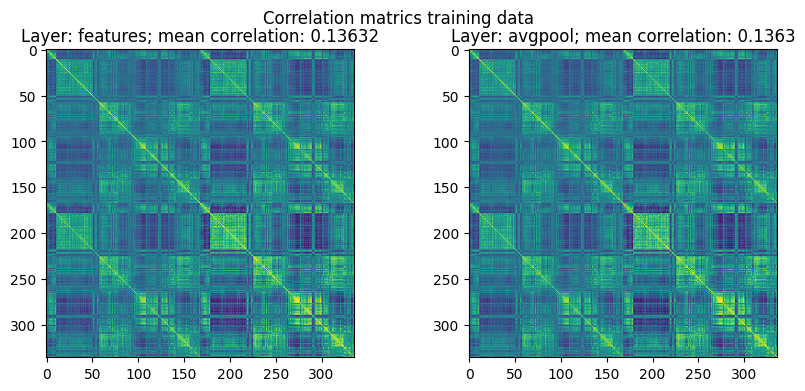

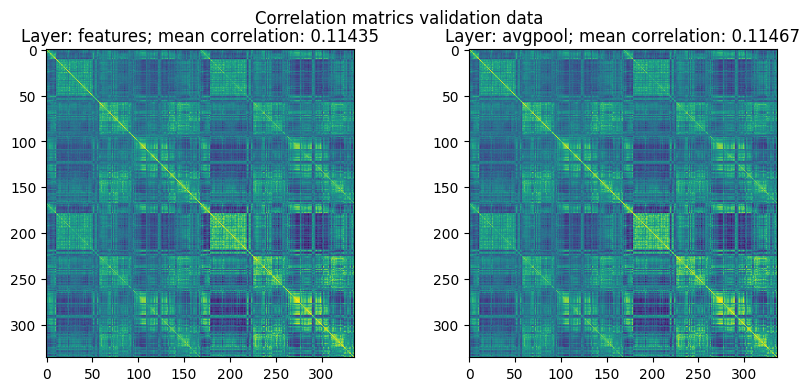

In [138]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
plt.suptitle('Vgg transferred')

i = 0

for layer in layer_pc.keys():
    corr_matrix = np.corrcoef(spikes_train,  train_predictions[layer], rowvar=False)
    axes[i].imshow(corr_matrix)
    axes[i].set_title(f"Layer: {layer}; mean correlation: {round(np.mean(corr_matrix), 5)}")
    i += 1
plt.suptitle("Correlation matrics training data")
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
i = 0

for layer in layer_pc.keys():
    corr_matrix_val = np.corrcoef(spikes_val,  val_predictions[layer], rowvar=False)
    axes[i].imshow(corr_matrix_val)
    axes[i].set_title(f"Layer: {layer}; mean correlation: {round(np.mean(corr_matrix_val), 5)}")
    i += 1
plt.suptitle("Correlation matrics validation data")
plt.show()

Again, very similar performance with the partially retrained vgg.

### Overall it seems like the best models are networks that were pretrained on image classification and have their last layers retrained to predict spikes, with the best of them being the resnet, which is also the best at image classification out of the models tried here. For a further comparison of those models, better controls on the number of parameters retrained would be necessary, or potentially an optimization model-specific of which layer and parameters to retrained could also give more information about the models themselves.